# Synthetically Generated SEM
This file contains synthetically generated SEM images at scales ranging from centimeters to nanometers. These images are valuable for training generative models that can produce continuous scale outputs of microstructures from cm to nm based on input images at varying scales. Since acquiring a large dataset of SEM images is resource-intensive, we combined real and synthetic images to train our model effectively.

# Approach

This algorithm generates multi-scale synthetic images by manipulating frequency distributions in k-space (Fourier space). It employs a power-law spectral density function combined with scale-specific features to create spatially coherent structures across multiple orders of magnitude. The implementation utilizes the Fast Fourier Transform (FFT) for efficient computation, with amplitude scaling following a 1/f² relationship and phase randomization to ensure stochastic variation while maintaining scale-specific correlations.

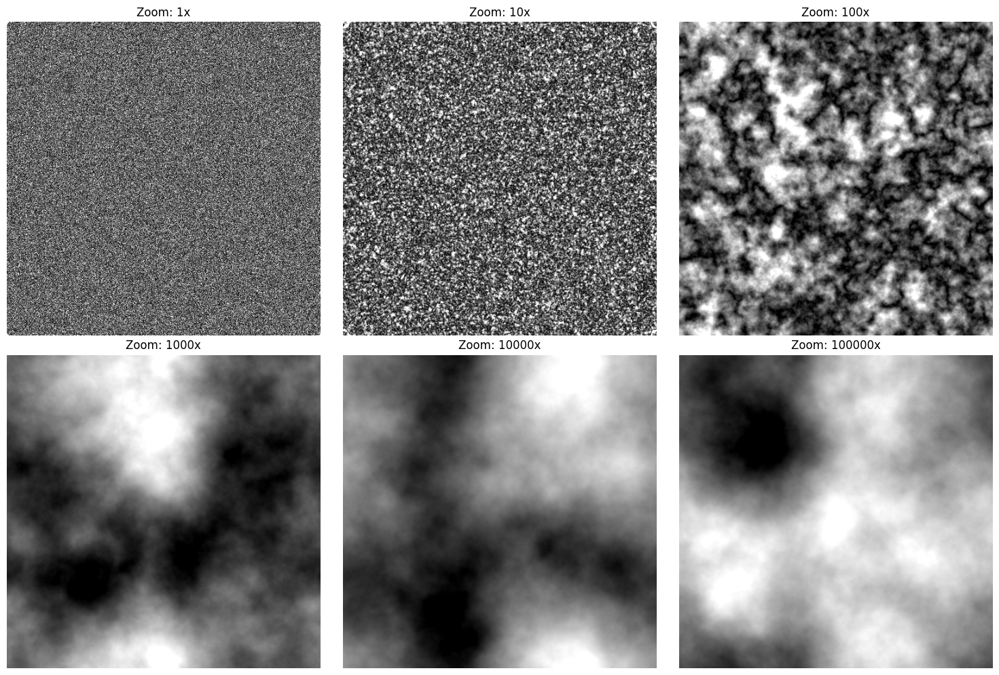

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_k_space(shape, scale_factor):
    """
    Generate k-space data with appropriate frequencies for a given scale factor.
    """
    kx, ky = np.meshgrid(np.fft.fftfreq(shape[0]), np.fft.fftfreq(shape[1]))
    k = np.sqrt(kx**2 + ky**2)

    # Generate noise with frequency-dependent amplitude
    amplitude = 1 / (1 + (k * scale_factor)**2)
    phase = 2 * np.pi * np.random.rand(*shape)
    k_space = amplitude * np.exp(1j * phase)

    # Add scale-specific features
    feature_size = 1 / scale_factor
    features = np.sin(2 * np.pi * k / feature_size) * np.exp(-k**2 / (2 * feature_size**2))
    k_space += 0.1 * features

    return k_space

def generate_image_from_k_space(k_space):
    """
    Convert the k-space data to a real-space image using the inverse FFT.
    """
    image = np.fft.ifft2(np.fft.ifftshift(k_space))
    image = np.abs(image)

    # Adjust contrast
    p2, p98 = np.percentile(image, (2, 98))
    image = np.clip(image, p2, p98)

    # Normalize
    image = (image - np.min(image)) / (np.max(image) - np.min(image))

    return image

def generate_multiscale_images(size, zoom_levels):
    """Generate images for multiple zoom levels."""
    images = []
    for zoom in zoom_levels:
        k_space = generate_k_space((size, size), zoom)
        image = generate_image_from_k_space(k_space)
        images.append(image)
    return images

def plot_multiscale_images(images, zoom_levels):
    """Plot the images for different zoom levels."""
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()
    for ax, img, zoom in zip(axs, images, zoom_levels):
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'Zoom: {zoom}x')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Define zoom levels and generate images
size = 512
zoom_levels = [1, 10, 100, 1000, 10000, 100000]
images = generate_multiscale_images(size, zoom_levels)

# Plot the generated images
plot_multiscale_images(images, zoom_levels)

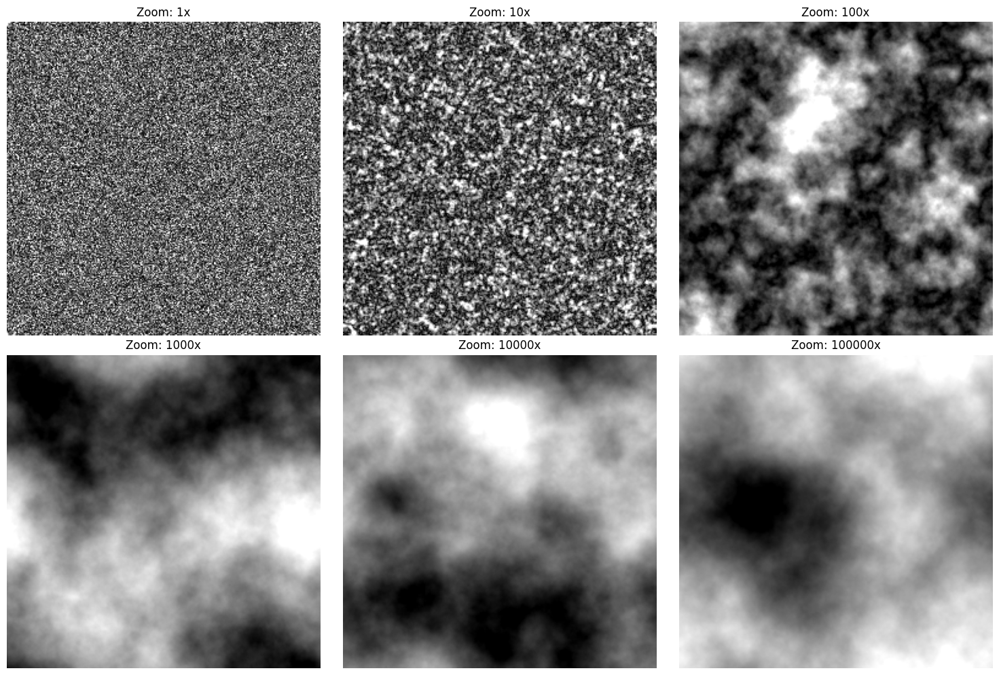

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_k_space(shape, scale_factor):
    """
    Generate k-space data with appropriate frequencies for a given scale factor.
    """
    kx, ky = np.meshgrid(np.fft.fftfreq(shape[0]), np.fft.fftfreq(shape[1]))
    k = np.sqrt(kx**2 + ky**2)

    # Generate noise with frequency-dependent amplitude
    amplitude = 1 / (1 + (k * scale_factor)**2)
    phase = 2 * np.pi * np.random.rand(*shape)
    k_space = amplitude * np.exp(1j * phase)

    # Add scale-specific features
    feature_size = 1 / scale_factor
    features = np.sin(2 * np.pi * k / feature_size) * np.exp(-k**2 / (2 * feature_size**2))
    k_space += 0.1 * features

    return k_space

def generate_image_from_k_space(k_space):
    """
    Convert the k-space data to a real-space image using the inverse FFT.
    """
    image = np.fft.ifft2(np.fft.ifftshift(k_space))
    image = np.abs(image)

    # Adjust contrast
    p2, p98 = np.percentile(image, (2, 98))
    image = np.clip(image, p2, p98)

    # Normalize
    image = (image - np.min(image)) / (np.max(image) - np.min(image))

    return image

def generate_multiscale_images(size, zoom_levels):
    """Generate images for multiple zoom levels."""
    images = []
    for zoom in zoom_levels:
        k_space = generate_k_space((size, size), zoom)
        image = generate_image_from_k_space(k_space)
        images.append(image)
    return images

def plot_multiscale_images(images, zoom_levels):
    """Plot the images for different zoom levels."""
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()
    for ax, img, zoom in zip(axs, images, zoom_levels):
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'Zoom: {zoom}x')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Define zoom levels and generate images
size = 256
zoom_levels = [1, 10, 100, 1000, 10000, 100000]
images = generate_multiscale_images(size, zoom_levels)

# Plot the generated images
plot_multiscale_images(images, zoom_levels)

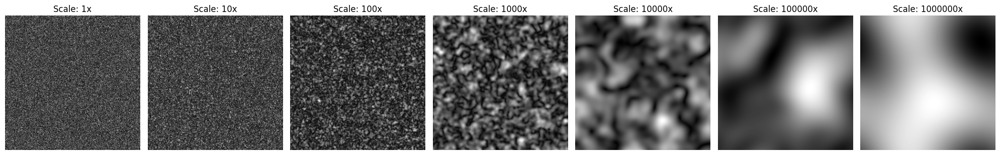

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_k_space(shape, scale_factor):
    """
    Generate random k-space with random-phase Fourier amplitudes.
    The scale_factor determines the high-frequency content (details) of the image.
    """
    k_space = np.random.normal(size=shape) + 1j * np.random.normal(size=shape)  # Complex noise

    # Apply a power spectrum filter based on scale_factor
    x = np.fft.fftfreq(shape[0])
    y = np.fft.fftfreq(shape[1])
    xx, yy = np.meshgrid(x, y, indexing='ij')
    radius = np.sqrt(xx**2 + yy**2)

    # Modified frequency window filter that decays more slowly for higher frequencies
    power_spectrum_filter = np.exp(-radius * scale_factor**0.5)  # Adjust the decay rate
    filtered_k_space = k_space * power_spectrum_filter

    return filtered_k_space

def generate_image_from_k_space(k_space):
    """
    Convert the k-space data to a real-space image using the inverse FFT.
    """
    image = np.fft.ifft2(k_space)
    image = np.abs(image)  # Take the magnitude to get the real image
    image = (image - np.min(image)) / (np.max(image) - np.min(image))  # Normalize to [0, 1]
    return image

# Define the scales for the images from cm to micrometer
scales = [1, 10, 100, 1000, 10_000, 100_000, 1_000_000]  # Example scale factors

# Generate images for each scale
images = []
for scale in scales:
    k_space = generate_random_k_space((256, 256), scale_factor=scale)
    image = generate_image_from_k_space(k_space)
    images.append(image)

# Plot the generated images for visualization
fig, axes = plt.subplots(1, len(scales), figsize=(20, 5))
for ax, img, scale in zip(axes, images, scales):
    ax.imshow(img, cmap='gray')
    ax.set_title(f'Scale: {scale}x')
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:

# Generate a large-scale (10 µm) image using the existing method
large_scale_k_space = generate_random_k_space((256, 256), scale_factor=10)
large_scale_image = generate_image_from_k_space(large_scale_k_space)
# Extract a 2.7 µm subregion from the 10 µm image
subregion_image = large_scale_image[64:128, 64:128]  # Example subregion of size 64x64 pixels
# Generate a directly created 2.7 µm image
smaller_scale_k_space = generate_random_k_space((64, 64), scale_factor=2.7)
smaller_scale_image = generate_image_from_k_space(smaller_scale_k_space)
# Compute the gradient of the images
gradient_subregion = np.gradient(subregion_image)
gradient_smaller_scale = np.gradient(smaller_scale_image)

# Compute the statistical measure \int |grad image|^4 dA for each image
measure_subregion = np.sum(np.abs(gradient_subregion[0])**4 + np.abs(gradient_subregion[1])**4)
measure_smaller_scale = np.sum(np.abs(gradient_smaller_scale[0])**4 + np.abs(gradient_smaller_scale[1])**4)

print(f"Statistical Measure for 2.7 µm Subregion (extracted): {measure_subregion}")
print(f"Statistical Measure for Directly Generated 2.7 µm Image: {measure_smaller_scale}")


Statistical Measure for 2.7 µm Subregion (extracted): 2.592559800567091
Statistical Measure for Directly Generated 2.7 µm Image: 9.69018833832316


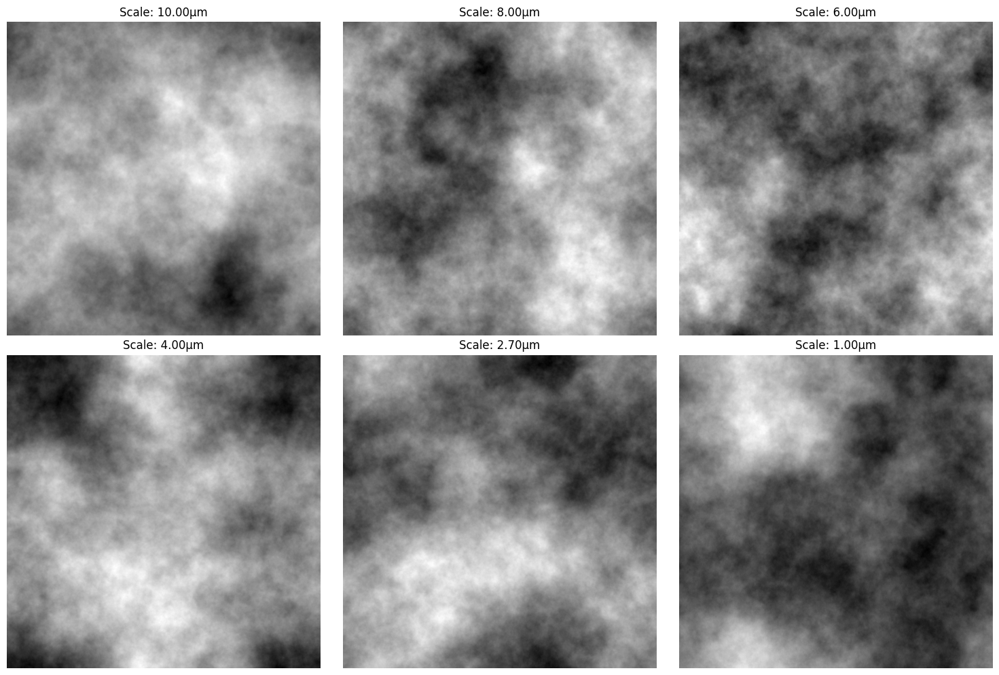

Statistics for 2.70µm scale:
Subsampled region: 3.4142e-09
Directly generated: 1.2638e-10
Relative difference: 2601.5648%


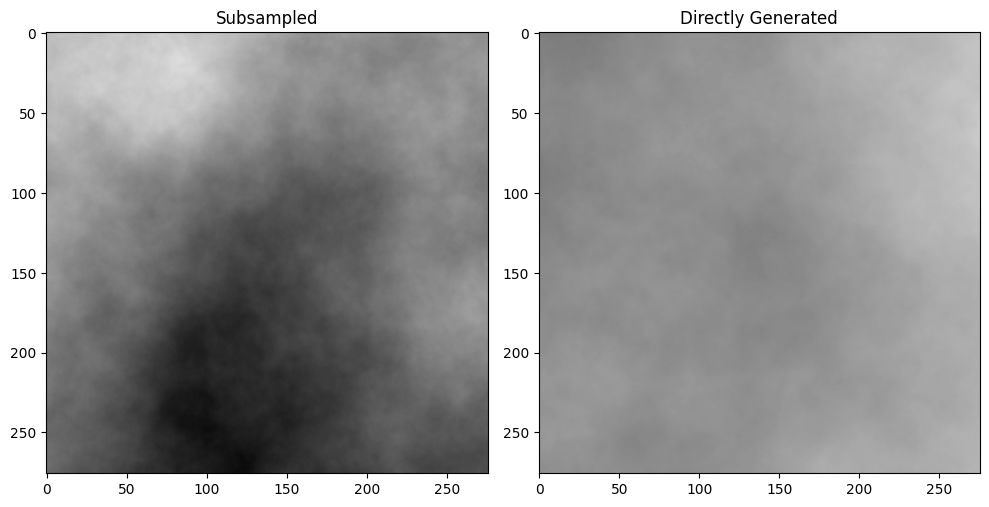

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

def generate_fractal_noise(shape, hurst, scale=1.0):
    """
    Generate a 2D fractal noise image using the spectral synthesis method.

    :param shape: Tuple of image dimensions
    :param hurst: Hurst exponent (determines the fractal dimension)
    :param scale: Scaling factor
    :return: 2D numpy array of fractal noise
    """
    x = np.fft.fftfreq(shape[0]) * scale
    y = np.fft.fftfreq(shape[1]) * scale
    x, y = np.meshgrid(x, y, indexing='ij')

    r = np.sqrt(x**2 + y**2)
    r[0, 0] = 1  # Avoid division by zero

    amplitude = r ** (-(hurst + 1))  # Changed exponent
    phase = 2 * np.pi * np.random.rand(*shape)

    fft_image = amplitude * np.exp(1j * phase)
    image = np.fft.ifft2(fft_image).real

    return (image - np.min(image)) / (np.max(image) - np.min(image))

def generate_multiscale_images(base_size, scales, hurst=0.7):
    """Generate statistically self-similar images at different scales."""
    images = []
    for scale in scales:
        size = int(base_size * (10 / scale))  # Adjust size based on scale
        image = generate_fractal_noise((size, size), hurst, scale=scale/10)
        images.append(image)
    return images

def calculate_gradient_statistic(image):
    """Calculate the integral of the 4th power of the image gradient magnitude."""
    grad_x, grad_y = np.gradient(image)
    grad_mag = np.sqrt(grad_x**2 + grad_y**2)
    return np.mean(grad_mag**4)  # Use mean instead of sum for scale invariance

def plot_multiscale_images(images, scales):
    """Plot the images for different scales."""
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()
    for ax, img, scale in zip(axs, images, scales):
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'Scale: {scale:.2f}µm')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def compare_statistics(full_image, full_scale, subsample_scale, direct_image):
    """Compare statistics of subsampled region with directly generated image."""
    full_size = full_image.shape[0]
    subsample_size = int(full_size * (subsample_scale / full_scale))

    # Random starting point for subsampling
    start = np.random.randint(0, full_size - subsample_size)
    subsampled = full_image[start:start+subsample_size, start:start+subsample_size]

    # Ensure direct image is the same size as subsampled
    if direct_image.shape != subsampled.shape:
        direct_image = direct_image[:subsample_size, :subsample_size]

    # Calculate statistics
    stat_subsampled = calculate_gradient_statistic(subsampled)
    stat_direct = calculate_gradient_statistic(direct_image)

    print(f"Statistics for {subsample_scale:.2f}µm scale:")
    print(f"Subsampled region: {stat_subsampled:.4e}")
    print(f"Directly generated: {stat_direct:.4e}")
    print(f"Relative difference: {abs(stat_subsampled - stat_direct) / stat_direct:.4%}")

    # Plot comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.imshow(subsampled, cmap='gray', vmin=0, vmax=1)
    ax1.set_title('Subsampled')
    ax2.imshow(direct_image, cmap='gray', vmin=0, vmax=1)
    ax2.set_title('Directly Generated')
    plt.tight_layout()
    plt.show()

# Generate and plot multiscale images
base_size = 1024  # Increased for better resolution
scales = [10, 8, 6, 4, 2.7, 1]  # Scales in µm, including 2.7µm
images = generate_multiscale_images(base_size, scales)
plot_multiscale_images(images, scales)

# Demonstrate statistical similarity
full_scale = 10  # µm
subsample_scale = 2.7  # µm
subsample_index = scales.index(subsample_scale)

compare_statistics(images[0], full_scale, subsample_scale, images[subsample_index])

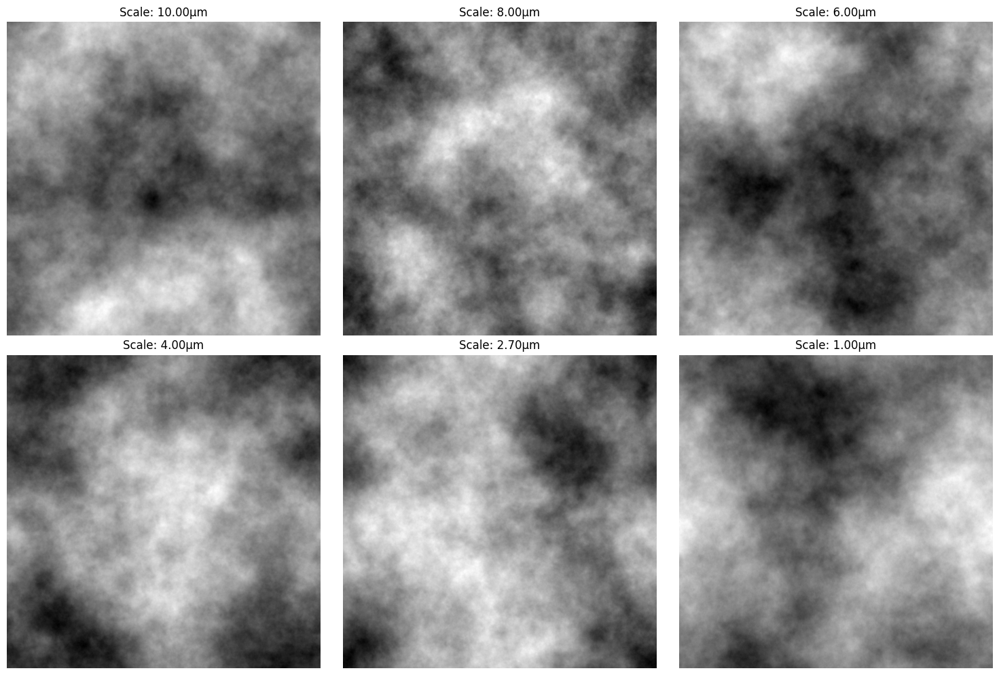

Statistics for 2.70µm scale:
Subsampled region: 4.0868e-09
Directly generated: 1.5893e-10
Relative difference: 2471.4357%


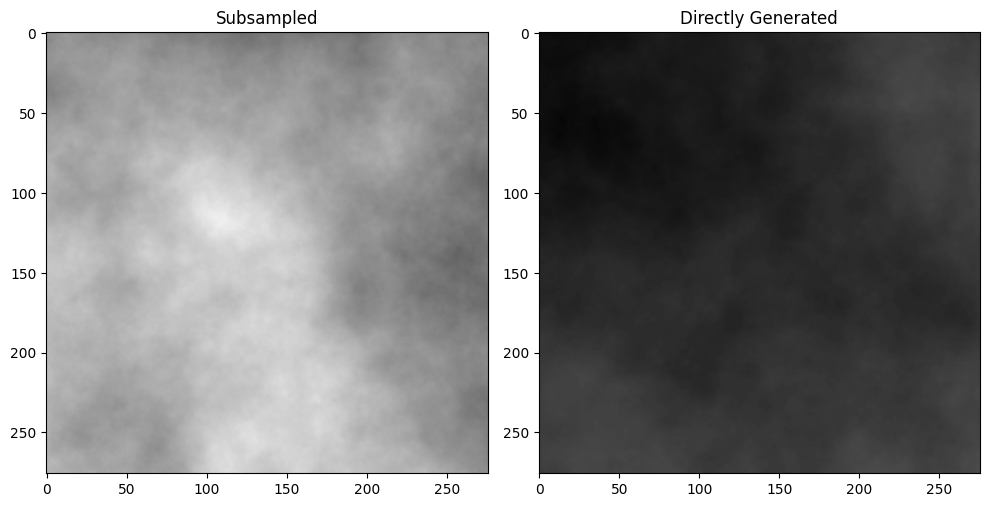

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

def generate_fractal_noise(shape, hurst, scale=1.0):
    """
    Generate a 2D fractal noise image using the spectral synthesis method.

    :param shape: Tuple of image dimensions
    :param hurst: Hurst exponent (determines the fractal dimension)
    :param scale: Scaling factor
    :return: 2D numpy array of fractal noise
    """
    x = np.fft.fftfreq(shape[0]) * scale
    y = np.fft.fftfreq(shape[1]) * scale
    x, y = np.meshgrid(x, y, indexing='ij')

    r = np.sqrt(x**2 + y**2)
    r[0, 0] = 1  # Avoid division by zero

    amplitude = r ** (-(hurst + 1))  # Changed exponent
    phase = 2 * np.pi * np.random.rand(*shape)

    fft_image = amplitude * np.exp(1j * phase)
    image = np.fft.ifft2(fft_image).real

    return (image - np.min(image)) / (np.max(image) - np.min(image))

def generate_multiscale_images(base_size, scales, hurst=0.7):
    """Generate statistically self-similar images at different scales."""
    images = []
    for scale in scales:
        size = int(base_size * (10 / scale))  # Adjust size based on scale
        image = generate_fractal_noise((size, size), hurst, scale=scale/10)
        images.append(image)
    return images

def calculate_gradient_statistic(image):
    """Calculate the integral of the 4th power of the image gradient magnitude."""
    grad_x, grad_y = np.gradient(image)
    grad_mag = np.sqrt(grad_x**2 + grad_y**2)
    return np.mean(grad_mag**4)  # Use mean instead of sum for scale invariance

def plot_multiscale_images(images, scales):
    """Plot the images for different scales."""
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()
    for ax, img, scale in zip(axs, images, scales):
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'Scale: {scale:.2f}µm')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def compare_statistics(full_image, full_scale, subsample_scale, direct_image):
    """Compare statistics of subsampled region with directly generated image."""
    full_size = full_image.shape[0]
    subsample_size = int(full_size * (subsample_scale / full_scale))

    # Random starting point for subsampling
    start = np.random.randint(0, full_size - subsample_size)
    subsampled = full_image[start:start+subsample_size, start:start+subsample_size]

    # Ensure direct image is the same size as subsampled
    if direct_image.shape != subsampled.shape:
        direct_image = direct_image[:subsample_size, :subsample_size]

    # Calculate statistics
    stat_subsampled = calculate_gradient_statistic(subsampled)
    stat_direct = calculate_gradient_statistic(direct_image)

    print(f"Statistics for {subsample_scale:.2f}µm scale:")
    print(f"Subsampled region: {stat_subsampled:.4e}")
    print(f"Directly generated: {stat_direct:.4e}")
    print(f"Relative difference: {abs(stat_subsampled - stat_direct) / stat_direct:.4%}")

    # Plot comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.imshow(subsampled, cmap='gray', vmin=0, vmax=1)
    ax1.set_title('Subsampled')
    ax2.imshow(direct_image, cmap='gray', vmin=0, vmax=1)
    ax2.set_title('Directly Generated')
    plt.tight_layout()
    plt.show()

# Generate and plot multiscale images
base_size = 1024  # Increased for better resolution
scales = [10, 8, 6, 4, 2.7, 1]  # Scales in µm, including 2.7µm
images = generate_multiscale_images(base_size, scales)
plot_multiscale_images(images, scales)

# Demonstrate statistical similarity
full_scale = 10  # µm
subsample_scale = 2.7  # µm
subsample_index = scales.index(subsample_scale)

compare_statistics(images[0], full_scale, subsample_scale, images[subsample_index])

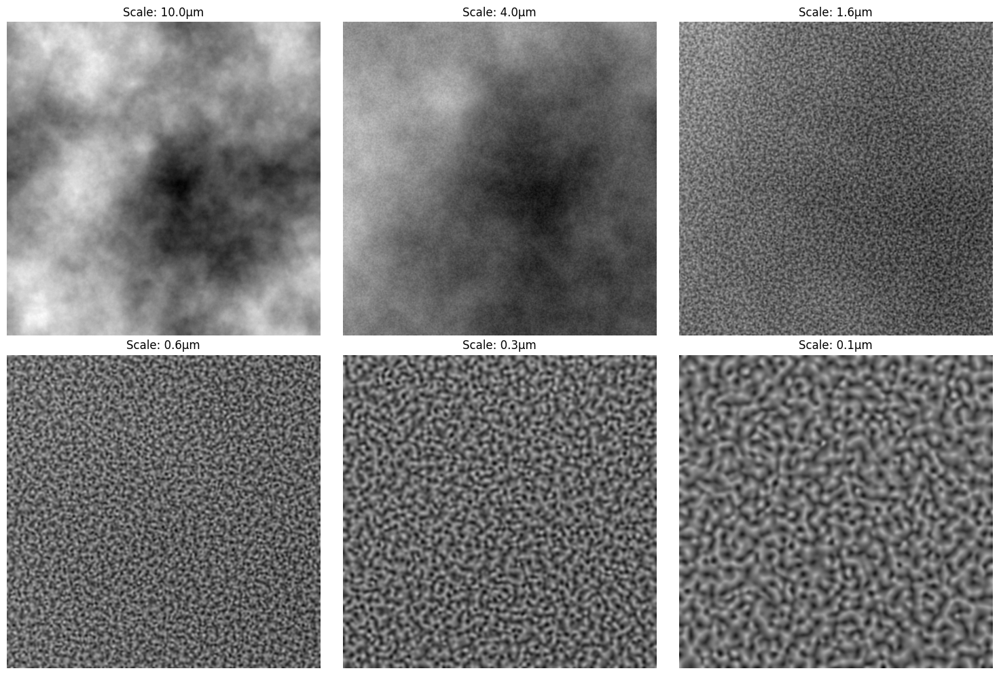

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

def generate_fractal_noise(shape, hurst, scale=1.0):
    """
    Generate a 2D fractal noise image using the spectral synthesis method.
    """
    x = np.fft.fftfreq(shape[0]) * scale
    y = np.fft.fftfreq(shape[1]) * scale
    x, y = np.meshgrid(x, y, indexing='ij')

    r = np.sqrt(x**2 + y**2)
    r[0, 0] = 1  # Avoid division by zero

    amplitude = r ** (-(hurst + 1))
    phase = 2 * np.pi * np.random.rand(*shape)

    fft_image = amplitude * np.exp(1j * phase)
    image = np.fft.ifft2(fft_image).real

    return (image - np.min(image)) / (np.max(image) - np.min(image))

def generate_detail_noise(shape, scale_factor):
    """
    Generate detail-preserving noise that matches the scale of observation.
    """
    base_noise = np.random.randn(*shape)
    # Smooth the noise proportionally to the scale
    sigma = 0.5 * (scale_factor ** 0.5)
    smoothed_noise = ndimage.gaussian_filter(base_noise, sigma=sigma)
    # Normalize to small amplitude
    smoothed_noise = smoothed_noise / np.max(np.abs(smoothed_noise))
    return smoothed_noise * 0.1 * (scale_factor ** 0.3)

def enhance_texture(image, scale_factor):
    """
    Enhance texture details in the image based on zoom level.
    """
    # Generate and add scale-appropriate noise
    detail_noise = generate_detail_noise(image.shape, scale_factor)
    enhanced = image + detail_noise

    # Apply local contrast enhancement
    local_size = max(3, int(image.shape[0] / 20))
    local_mean = ndimage.gaussian_filter(enhanced, sigma=local_size/6)
    local_std = np.sqrt(ndimage.gaussian_filter(enhanced**2, sigma=local_size/6) - local_mean**2)

    enhanced = (enhanced - local_mean) / (local_std + 1e-5)

    # Normalize to [0,1] range
    enhanced = (enhanced - np.min(enhanced)) / (np.max(enhanced) - np.min(enhanced))

    # Blend with original based on scale
    blend_factor = min(0.7, (scale_factor - 1) / 10)
    final = blend_factor * enhanced + (1 - blend_factor) * image

    return final

def zoom_fractal_image(base_image, start_scale, target_scale, center_point=None, num_steps=6):
    """
    Zoom into a specific region of the base image through multiple steps with interpolation.
    """
    total_zoom = start_scale / target_scale
    zoom_per_step = total_zoom ** (1 / (num_steps - 1))

    if center_point is None:
        center_point = (base_image.shape[0] // 2, base_image.shape[1] // 2)

    scales = [start_scale * (zoom_per_step ** (-i)) for i in range(num_steps)]
    zoomed_images = []

    # Size of the output images (keep consistent across zoom levels)
    output_size = 512

    for i, scale in enumerate(scales):
        if i == 0:
            # Resize base image to output size
            zoomed_images.append(ndimage.zoom(base_image, output_size/base_image.shape[0]))
            continue

        # Calculate the region to zoom into
        window_size = int(base_image.shape[0] / (zoom_per_step ** i))
        half_window = window_size // 2

        # Calculate boundaries for cropping
        x_start = center_point[0] - half_window
        x_end = center_point[0] + half_window
        y_start = center_point[1] - half_window
        y_end = center_point[1] + half_window

        # Ensure boundaries are within image
        x_start = max(0, min(x_start, base_image.shape[0] - window_size))
        x_end = min(base_image.shape[0], x_start + window_size)
        y_start = max(0, min(y_start, base_image.shape[1] - window_size))
        y_end = min(base_image.shape[1], y_start + window_size)

        # Crop the image
        cropped = base_image[x_start:x_end, y_start:y_end]

        # Interpolate to output size using spline interpolation
        zoomed = ndimage.zoom(cropped, output_size/cropped.shape[0], order=3)

        # Apply texture enhancement with scale-dependent noise
        scale_factor = start_scale / scale
        enhanced = enhance_texture(zoomed, scale_factor)

        zoomed_images.append(enhanced)

    return zoomed_images, scales

def plot_zoom_sequence(images, scales):
    """Plot the sequence of zoomed images."""
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()

    for ax, img, scale in zip(axs, images, scales):
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f'Scale: {scale:.1f}µm')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Generate base image at 10 micrometers
base_size = 2048  # Using larger base size for better resolution when zooming
base_image = generate_fractal_noise((base_size, base_size), hurst=0.7, scale=1.0)

# Create zoom sequence from 10µm to 0.1µm
zoomed_images, scales = zoom_fractal_image(
    base_image,
    start_scale=10,
    target_scale=0.1,
    center_point=None,  # Will use image center
    num_steps=6
)

# Plot the zoom sequence
plot_zoom_sequence(zoomed_images, scales)

Generating fractal zoom sequence...
Creating zoom animation...
Analyzing topological features...


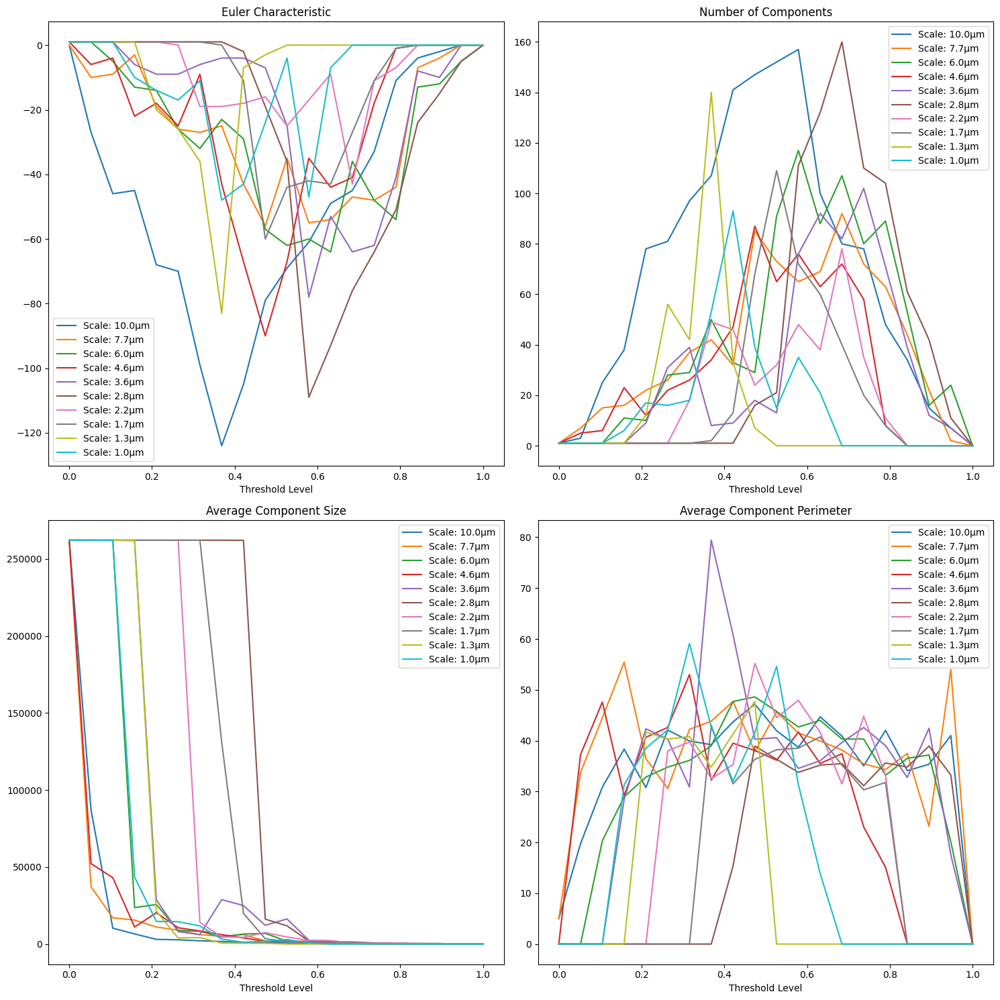

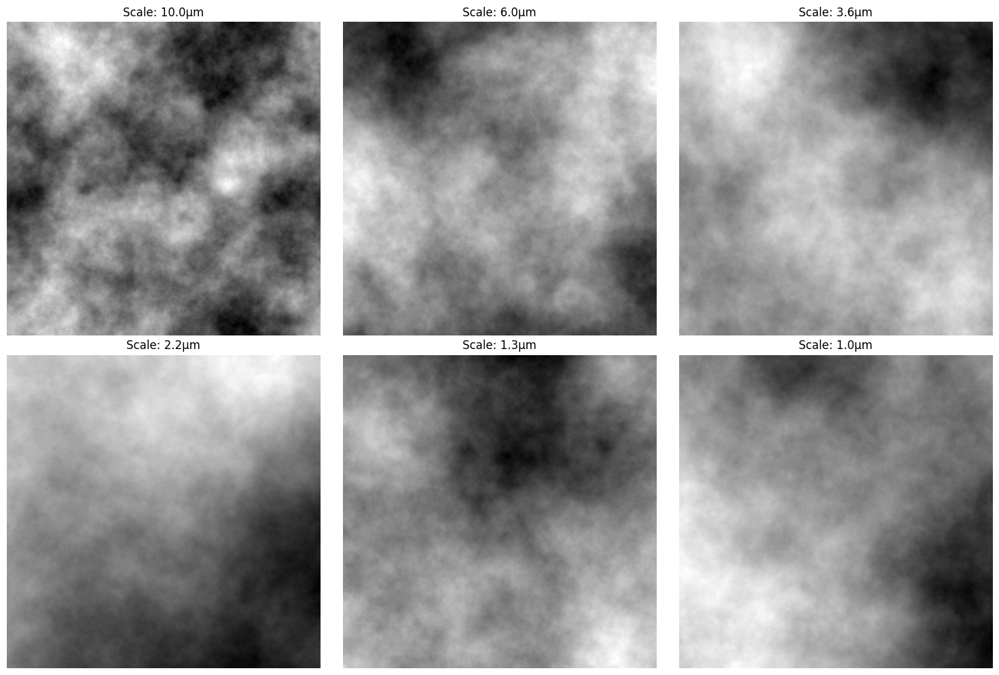

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import measure
from scipy.spatial.distance import cdist
import matplotlib.animation as animation

def generate_fractal_noise(shape, hurst, scale=1.0, seed=None):
    """
    Generate a 2D fractal noise image using the spectral synthesis method.
    Added seed parameter for reproducibility during zooming.
    """
    if seed is not None:
        np.random.seed(seed)

    x = np.fft.fftfreq(shape[0]) * scale
    y = np.fft.fftfreq(shape[1]) * scale
    x, y = np.meshgrid(x, y, indexing='ij')
    r = np.sqrt(x**2 + y**2)
    r[0, 0] = 1  # Avoid division by zero

    # Modified amplitude spectrum for better detail preservation
    amplitude = r ** (-(hurst + 1))
    amplitude *= np.exp(-r/2)  # Add exponential damping for stability

    phase = 2 * np.pi * np.random.rand(*shape)
    fft_image = amplitude * np.exp(1j * phase)
    image = np.fft.ifft2(fft_image).real

    # Normalize
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def generate_continuous_zoom(base_size, zoom_center, zoom_levels, hurst=0.7):
    """
    Generate a sequence of images that continuously zoom into a point.

    Parameters:
    base_size: Initial image size
    zoom_center: (x, y) coordinates to zoom into
    zoom_levels: Number of zoom steps
    hurst: Hurst exponent
    """
    images = []
    zoom_factors = np.logspace(0, 2, zoom_levels)  # Logarithmic zoom scale

    for i, zoom in enumerate(zoom_factors):
        # Generate base image with increasing detail
        size = int(base_size * np.sqrt(zoom))
        # Use different but correlated seeds for each level
        seed = 42 + i

        # Generate the zoomed image
        image = generate_fractal_noise((size, size), hurst, scale=1/zoom, seed=seed)

        # Calculate the region to crop
        crop_size = base_size
        center_x = int(size * zoom_center[0])
        center_y = int(size * zoom_center[1])

        # Crop around zoom center
        start_x = center_x - crop_size//2
        start_y = center_y - crop_size//2
        end_x = start_x + crop_size
        end_y = start_y + crop_size

        # Ensure boundaries
        if start_x < 0: start_x = 0
        if start_y < 0: start_y = 0
        if end_x > size: end_x = size
        if end_y > size: end_y = size

        cropped = image[start_x:end_x, start_y:end_y]

        # Resize to base_size if necessary
        if cropped.shape != (base_size, base_size):
            cropped = ndimage.zoom(cropped, (base_size/cropped.shape[0], base_size/cropped.shape[1]))

        images.append(cropped)

    return images

def calculate_topological_features(image, n_levels=20):
    """
    Calculate topological features including:
    - Euler characteristic at different thresholds
    - Persistent homology-inspired metrics
    - Connected component analysis
    """
    levels = np.linspace(0, 1, n_levels)
    features = {
        'euler_chars': [],
        'n_components': [],
        'avg_component_size': [],
        'component_perimeters': []
    }

    for level in levels:
        # Threshold the image
        binary = image > level

        # Find connected components
        labels, n_components = ndimage.label(binary)

        # Calculate Euler characteristic
        contours = measure.find_contours(binary.astype(float), 0.5)
        euler_char = n_components - len(contours)

        # Calculate component properties
        if n_components > 0:
            sizes = [np.sum(labels == i) for i in range(1, n_components + 1)]
            avg_size = np.mean(sizes)

            # Calculate perimeters
            perimeters = [len(contour) for contour in contours]
            avg_perimeter = np.mean(perimeters) if perimeters else 0
        else:
            avg_size = 0
            avg_perimeter = 0

        features['euler_chars'].append(euler_char)
        features['n_components'].append(n_components)
        features['avg_component_size'].append(avg_size)
        features['component_perimeters'].append(avg_perimeter)

    return features, levels

def compare_topological_features(images, scales):
    """
    Compare topological features across different zoom levels
    """
    all_features = []
    for img in images:
        features, levels = calculate_topological_features(img)
        all_features.append(features)

    # Plot topological features
    fig, axs = plt.subplots(2, 2, figsize=(15, 15))
    axs = axs.flatten()

    feature_names = ['euler_chars', 'n_components', 'avg_component_size', 'component_perimeters']
    titles = ['Euler Characteristic', 'Number of Components',
             'Average Component Size', 'Average Component Perimeter']

    for idx, (feature_name, title) in enumerate(zip(feature_names, titles)):
        for i, features in enumerate(all_features):
            axs[idx].plot(levels, features[feature_name],
                         label=f'Scale: {scales[i]:.1f}µm')
        axs[idx].set_title(title)
        axs[idx].set_xlabel('Threshold Level')
        axs[idx].legend()

    plt.tight_layout()
    plt.show()

def create_zoom_animation(images, output_file='fractal_zoom.gif'):
    """
    Create an animation of the zooming process
    """
    fig, ax = plt.subplots(figsize=(8, 8))

    def update(frame):
        ax.clear()
        ax.imshow(images[frame], cmap='gray')
        ax.set_title(f'Zoom level: {frame+1}')
        ax.axis('off')

    anim = animation.FuncAnimation(fig, update, frames=len(images),
                                 interval=500, repeat=False)
    anim.save(output_file, writer='pillow')
    plt.close()

# Main execution
if __name__ == "__main__":
    # Parameters
    base_size = 512
    zoom_center = (0.5, 0.5)  # Center of the image
    zoom_levels = 10
    scales = np.logspace(1, 0, zoom_levels)  # From 10µm to 1µm

    # Generate zooming sequence
    print("Generating fractal zoom sequence...")
    images = generate_continuous_zoom(base_size, zoom_center, zoom_levels)

    # Create animation
    print("Creating zoom animation...")
    create_zoom_animation(images)

    # Compare topological features
    print("Analyzing topological features...")
    compare_topological_features(images, scales)

    # Display a few sample images
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()

    sample_indices = [0, 2, 4, 6, 8, -1]
    for ax, idx in zip(axs, sample_indices):
        ax.imshow(images[idx], cmap='gray')
        ax.set_title(f'Scale: {scales[idx]:.1f}µm')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

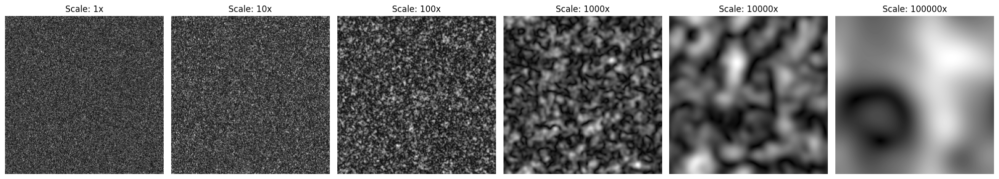

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def generate_random_k_space(shape, scale_factor):
    """
    Generate random k-space with random-phase Fourier amplitudes.
    The scale_factor determines the high-frequency content (details) of the image.
    """
    k_space = np.random.normal(size=shape) + 1j * np.random.normal(size=shape)  # Complex noise

    # Apply a power spectrum filter based on scale_factor
    x = np.fft.fftfreq(shape[0])
    y = np.fft.fftfreq(shape[1])
    xx, yy = np.meshgrid(x, y, indexing='ij')
    radius = np.sqrt(xx**2 + yy**2)

    # Modified frequency window filter that decays more slowly for higher frequencies
    power_spectrum_filter = np.exp(-radius * scale_factor**0.5)  # Adjust the decay rate
    filtered_k_space = k_space * power_spectrum_filter

    return filtered_k_space

def generate_image_from_k_space(k_space):
    """
    Convert the k-space data to a real-space image using the inverse FFT.
    """
    image = np.fft.ifft2(k_space)
    image = np.abs(image)  # Take the magnitude to get the real image
    image = (image - np.min(image)) / (np.max(image) - np.min(image))  # Normalize to [0, 1]
    return image

# Define the scales for the images from cm to micrometer
scales = [1, 10, 100, 1000, 10_000, 100_000]  # Example scale factors

# Generate images for each scale
images = []
for scale in scales:
    k_space = generate_random_k_space((256, 256), scale_factor=scale)
    image = generate_image_from_k_space(k_space)
    images.append(image)

# Plot the generated images for visualization
fig, axes = plt.subplots(1, len(scales), figsize=(20, 5))
for ax, img, scale in zip(axes, images, scales):
    ax.imshow(img, cmap='gray')
    ax.set_title(f'Scale: {scale}x')
    ax.axis('off')

plt.tight_layout()
plt.show()
